In [1]:
from scripts.db import *
from scripts.plots import *
from scripts.stats import *
import numpy as np  
import pandas as pd  
import matplotlib.pyplot as plt  
%matplotlib inline
from sklearn import linear_model
import os
import json

In [2]:
users, db = dataProcesada(filtroCompletadoActivo=False)

In [3]:
data = db
data = data[['alias', 'userId', 'EnvioInstance','Finalizado', 'OrientacionEntrenamiento', 'Refrencia', 'faseActiva','identificadorNivel', 'levelInstance', 'sessionInstance', 'AnguloFijo','Desviacion', 'IdEstimulo', 'NivelSenalDinamica', 'NivelSenalEstimulo', 'RtaCorrecta','TipoDeTrial']]
data = data[data['faseActiva']!='Tutorial']


mapNames = {'ExpT_Marco':'Sujeto01','ExpT_Carolina':'Sujeto02','ExpT_Magdalena':'Sujeto03','ExpT_Ivan':'Sujeto04','ExpT_Enzo':'Sujeto05',
            'ExpT_Julieta':'Sujeto06','ExpT_Gaston':'Sujeto07','ExpT_Andres':'Sujeto08','ExpT_CaroG':'Sujeto09','ExpT_Michelle':'Sujeto10'}

data['sujetos'] = data['alias'].map(mapNames)
#Datos perdidos
# Carolina primer test entrenamiento
# Magdalena primer entrenamiento ultimo dia
# Enzo primero del segundo dia

Vamos a hacer un analisis sujeto por sujeto

In [4]:
Sujeto = 2

# Filtramos la data

dataS = data[data['sujetos']=='Sujeto0'+str(Sujeto)]

# dataS = dataS.drop_duplicates()
#dataS = dataS[dataS['EnvioInstance']!=1472739152993]
#dataS.ix[dataS['levelInstance']==1473429833367,'faseActiva'] = 'Entrenamiento3'
# El sujeto 1 entreno en agulos
levels = dataS['levelInstance'].unique()
levels.sort()
if Sujeto == 1:
    levelsAProcesar= [levels[4],levels[8],levels[9],levels[10],levels[11],levels[12],levels[13],levels[14],levels[15],levels[16],levels[17],levels[18],levels[19],levels[24]]
if Sujeto == 2:
    levelsAProcesar= [levels[5],levels[9],levels[10],levels[11],levels[12],levels[13],levels[14],levels[17],levels[16],levels[15],levels[18],levels[19],levels[20],levels[25]]

dataConjunta = pd.DataFrame()

for level in levelsAProcesar:
    dataP = data[data['levelInstance']==level]
    if level == 1472738524843:
        dataP = dataP.iloc[0:100]
        serie = dataP['NivelSenalDinamica']
        serie[63:]=-1
        dataP['NivelSenalDinamica'] = serie

    if Sujeto in [1,2]:
        AMax = 79.6
        N = 200
        paso=AMax/N
        dataP['medida'] = (dataP['NivelSenalDinamica']+1)*paso
        
    if len (dataConjunta)>0: 
        dataConjunta = pd.concat([dataConjunta,dataP])
    else:
        dataConjunta = dataP

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


/usr/lib/python3/dist-packages/matplotlib/collections.py:549: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':
/usr/lib/python3/dist-packages/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


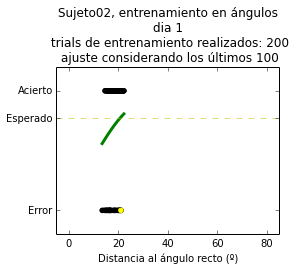

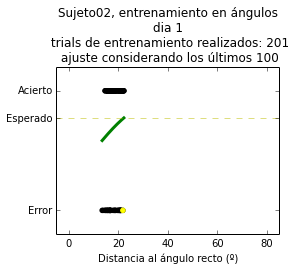

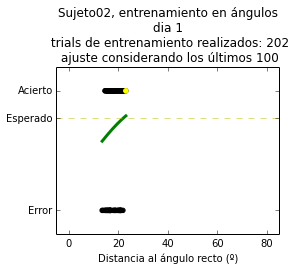

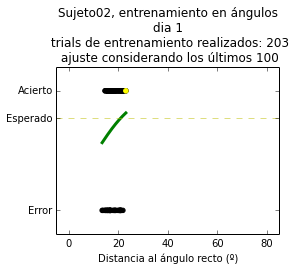

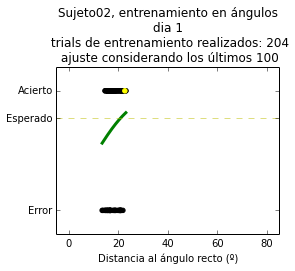

...

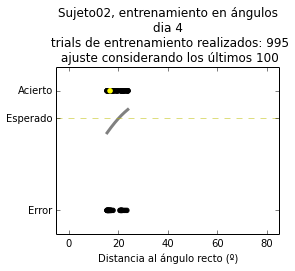

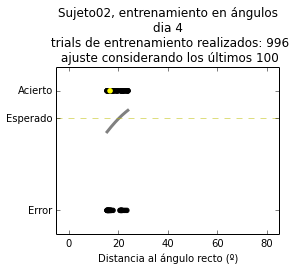

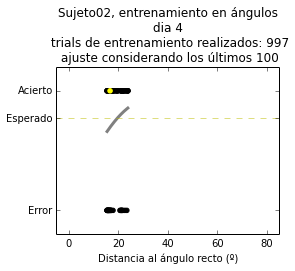

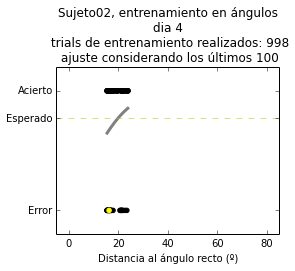

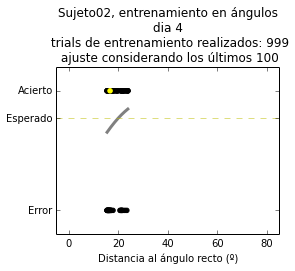

In [9]:
mapColor = {'TestInicial':'black', 'Entrenamiento1':'green', 'Entrenamiento2':'red', 'Entrenamiento3':'blue',
       'Entrenamiento4':'gray', 'TestFinal':'black'}


vmin=30

ventana = 100

TestInicial = False
TestFinal = False

if TestInicial:
    inicio=0
else:
    inicio = 40
    
if TestFinal:
    final=len(dataConjunta)
else:
    final=len(dataConjunta)-40



def model(x):
    return 1 / (1 + np.exp(-x))

j=0
for i in np.arange(inicio,final):
    
    if ventana < 0:
        if i-inicio<vmin:
            continue
        else:
            Ni=inicio
            Nf=i
    else:
        if i-ventana < inicio:
            continue
        else:
            Ni=i-ventana
            Nf=i
    
    
    
    X = np.array(dataConjunta["medida"])[Ni:Nf, np.newaxis]
    y = np.array(dataConjunta["RtaCorrecta"].astype(float))[Ni:Nf]

    sinDatos=False
    if ventana>0:
        if 0 in X:
            continue
    else:
        if X[-1] == 0:
            sinDatos = True
        X =  [elementofiltrado[0] for elementofiltrado in [elemento for elemento in zip(X,y) if elemento[0]!=0]]
        y =  [elementofiltrado[1] for elementofiltrado in [elemento for elemento in zip(X,y) if elemento[0]!=0]]
        
    
    clf = linear_model.LogisticRegression(C=1e5)
    clf.fit(X, y)

    # and plot the result
    fig, ax = plt.subplots(1,1,figsize=(4, 3))
    ax.set_xlim([-5,85])
    if ventana>0:
        ax.set_title(dataConjunta.iloc[0]['sujetos']+', entrenamiento en ángulos \n' + 'dia '+dataConjunta['faseActiva'].iloc[Nf-1][-1]+'\n trials de entrenamiento realizados: '+ str(Nf-40)+' \n ajuste considerando los últimos '+str(ventana))
    else:
        ax.set_title(dataConjunta.iloc[0]['sujetos']+', entrenamiento en ángulos \n' + 'dia '+dataConjunta['faseActiva'].iloc[Nf-1][-1]+'\n trials de entrenamiento realizados: '+ str(Nf-40))
    ax.scatter(X, y, color='black', zorder=20)
    ax.scatter(X[-1], y[-1], color='yellow', zorder=20)
    X_test = np.linspace(min(X), max(X), 300)

    loss = model(X_test * clf.coef_ + clf.intercept_).ravel()
    ax.plot(X_test, loss, color=mapColor[dataConjunta['faseActiva'].iloc[Nf-1]], linewidth=3)

    ax.axhline(y=0.77,linewidth=0.5, color='y', linestyle='dashed')
    ax.set_xlabel('Distancia al ángulo recto (º)')
    ax.set_yticks([0,0.77,1]) 
    ax.set_yticklabels(['Error','Esperado','Acierto'])
    if sinDatos:
        ax.text(40,0.5,'Sin datos para este trial', ha='center')
    
    directory = './Series/'+dataConjunta.iloc[0]['sujetos']+'_ventana_'+str(ventana)+'rango:'
    if not os.path.exists(directory):
        os.makedirs(directory)
    plt.savefig(directory+'/img'+str(j)+'.png', dpi=300, bbox_inches='tight')
    j = j+1
    #break

In [31]:
if ventana:
    print (True)
else:
    print (False)
        

True


In [26]:
clf.predict_proba(X)
x = np.arange(0,80)[:, np.newaxis]
resultado = clf.predict_proba(x)

len (resultado)

80

In [42]:
min(X)

array([ 42.984])

In [88]:
dataPrueba = data[data['alias']=='ExpT_Carolina']
pepe = dataPrueba[dataPrueba['levelInstance']==1472738524843]

In [93]:
pepe

,alias,userId,EnvioInstance,Finalizado,OrientacionEntrenamiento,Refrencia,faseActiva,identificadorNivel,levelInstance,sessionInstance,AnguloFijo,Desviacion,IdEstimulo,NivelSenalDinamica,NivelSenalEstimulo,RtaCorrecta,TipoDeTrial,sujetos
680,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,32.5,-169.605,570,199,200,True,Estimulo,Sujeto02
681,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,32.5,-29.750,920,150,151,True,Estimulo,Sujeto02
682,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,35.0,-169.605,1370,103,200,True,Test,Sujeto02
683,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,25.0,-131.685,1866,103,104,True,Estimulo,Sujeto02
684,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,23.0,-90.000,8184,59,0,False,NoEstimulo,Sujeto02
685,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,32.5,-130.895,668,101,102,False,Estimulo,Sujeto02
686,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,30.0,-146.695,228,141,142,True,Estimulo,Sujeto02
687,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,36.0,-90.000,8181,102,0,False,NoEstimulo,Sujeto02
688,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,30.0,-90.000,8170,139,0,True,NoEstimulo,Sujeto02
689,ExpT_Carolina,1472735163595,1472739152992,False,A30,30,Entrenamiento1,ENTRENAMIENTOA30INICIAL,1472738524843,1472735915319,30.0,-145.905,230,139,140,True,Estimulo,Sujeto02
